# Pharyngeal endoderm development analysis with the RealTimeKernel

## Import packages

In [1]:
import sys

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import mplscience
import seaborn as sns

import cellrank as cr
import scanpy as sc
import scvelo as scv
import wot
from anndata import AnnData

from cr2 import get_state_purity, plot_state_purity, running_in_notebook

sys.path.extend(["../../../", "."])
from paths import DATA_DIR, FIG_DIR  # isort: skip  # noqa: E402

Global seed set to 0


## General settings

In [2]:
sc.settings.verbosity = 2
cr.settings.verbosity = 4
scv.settings.verbosity = 3

In [3]:
scv.settings.set_figure_params("scvelo", dpi_save=400, dpi=80, transparent=True, fontsize=20, color_map="viridis")

In [4]:
SAVE_FIGURES = False
if SAVE_FIGURES:
    (FIG_DIR / "realtime_kernel" / "pharyngeal_endoderm").mkdir(parents=True, exist_ok=True)

FIGURE_FORMAT = "pdf"

In [5]:
(DATA_DIR / "pharyngeal_endoderm" / "results").mkdir(parents=True, exist_ok=True)

## Constants

In [6]:
# fmt: off
S_GENES = [
    "Mcm5", "Pcna", "Tyms", "Fen1", "Mcm2", "Mcm4", "Rrm1", "Ung", "Gins2",
    "Mcm6", "Cdca7", "Dtl", "Prim1", "Uhrf1", "Mlf1ip", "Hells", "Rfc2",
    "Rpa2", "Nasp", "Rad51ap1", "Gmnn", "Wdr76", "Slbp", "Ccne2", "Ubr7",
    "Pold3", "Msh2", "Atad2", "Rad51", "Rrm2", "Cdc45", "Cdc6", "Exo1",
    "Tipin", "Dscc1", "Blm", "Casp8ap2", "Usp1", "Clspn", "Pola1", "Chaf1b",
    "Brip1", "E2f8",
]

G2M_GENES = [
    "Hmgb2", "Cdk1", "Nusap1", "Ube2c", "Birc5", "Tpx2", "Top2a", "Ndc80",
    "Cks2", "Nuf2", "Cks1b", "Mki67", "Tmpo", "Cenpf", "Tacc3", "Fam64a",
    "Smc4", "Ccnb2", "Ckap2l", "Ckap2", "Aurkb", "Bub1", "Kif11", "Anp32e",
    "Tubb4b", "Gtse1", "Kif20b", "Hjurp", "Cdca3", "Hn1", "Cdc20", "Ttk",
    "Cdc25c", "Kif2c", "Rangap1", "Ncapd2", "Dlgap5", "Cdca2", "Cdca8",
    "Ect2", "Kif23", "Hmmr", "Aurka", "Psrc1", "Anln", "Lbr", "Ckap5",
    "Cenpe", "Ctcf", "Nek2", "G2e3", "Gas2l3", "Cbx5", "Cenpa",
]
# fmt: on

## Data loading

In [7]:
adata = sc.read(DATA_DIR / "pharyngeal_endoderm" / "raw" / "adata_pharynx.h5ad")
adata.obsm["X_umap"] = adata.obs[["UMAP1", "UMAP2"]].values
adata.obs["day"] = adata.obs["day_str"].astype(float)
adata.obs = adata.obs[["cluster_name", "day", "is_doublet"]]
adata

AnnData object with n_obs × n_vars = 54044 × 27998
    obs: 'cluster_name', 'day', 'is_doublet'
    obsm: 'X_umap'

## Data preprocessing

In [8]:
sc.pp.highly_variable_genes(adata)

extracting highly variable genes
    finished (0:00:15)


In [9]:
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:02:38)


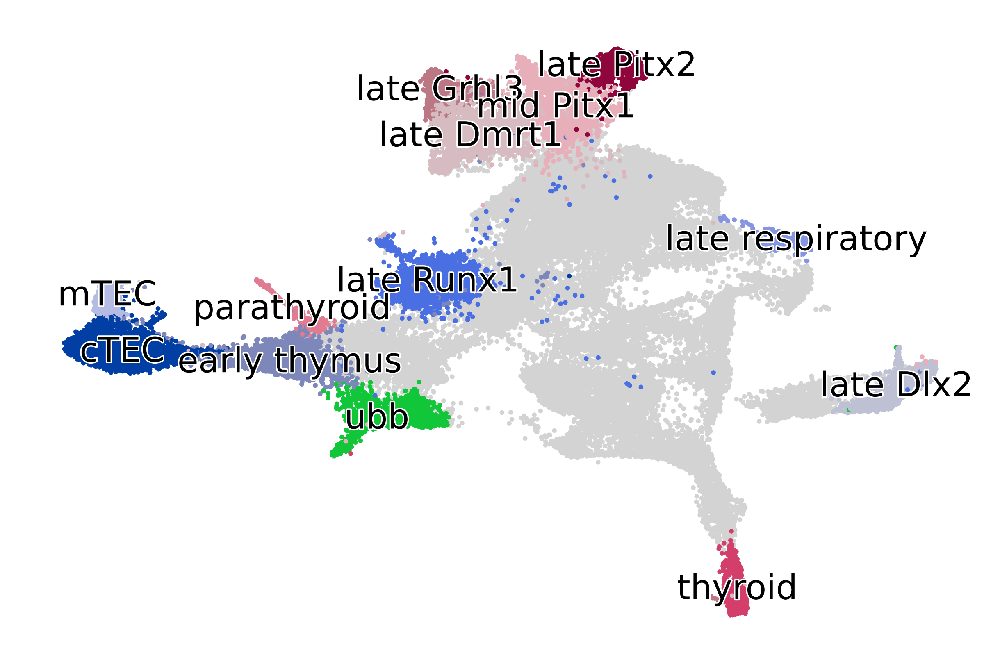

In [10]:
if running_in_notebook():
    scv.pl.scatter(
        adata, basis="umap", c="cluster_name", title="", dpi=250, legend_fontsize=12, legend_fontweight="normal"
    )

if SAVE_FIGURES:
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata, basis="umap", c="cluster_name", legend_loc=False, title="", ax=ax)
    fig.savefig(
        FIG_DIR / "realtime_kernel" / "pharyngeal_endoderm" / f"umap_colored_by_cell_type_full_data.{FIGURE_FORMAT}",
        format=FIGURE_FORMAT,
        transparent=True,
        bbox_inches="tight",
    )

    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata, basis="umap", c="day", legend_loc=False, title="", ax=ax)
    fig.savefig(
        FIG_DIR / "realtime_kernel" / "pharyngeal_endoderm" / f"umap_colored_by_day_full_data.{FIGURE_FORMAT}",
        format=FIGURE_FORMAT,
        transparent=True,
        bbox_inches="tight",
    )

## CellRank

### Kernel

In [11]:
if not (DATA_DIR / "pharyngeal_endoderm" / "tmaps_full_data").exists():
    ot_model = wot.ot.OTModel(adata)
    ot_model.compute_all_transport_maps(tmap_out=DATA_DIR / "pharyngeal_endoderm" / "tmaps_full_data" / "tmaps")

In [12]:
adata.obs["day"] = adata.obs["day"].astype("category")

rtk = cr.kernels.RealTimeKernel.from_wot(
    adata, path=DATA_DIR / "pharyngeal_endoderm" / "tmaps_full_data", time_key="day"
)
rtk.compute_transition_matrix(
    growth_iters=3, growth_rate_key="growth_rate_init", self_transitions="all", conn_weight=0.1
)

Only considering the two last: ['.5', '.h5ad'].
Only considering the two last: ['.5', '.h5ad'].
Only considering the two last: ['.5', '.h5ad'].
Only considering the two last: ['.5', '.h5ad'].
Only considering the two last: ['.5', '.h5ad'].
Only considering the two last: ['.5', '.h5ad'].


  0%|          | 0/3 [00:00<?, ?time pair/s]

Using automatic `threshold=0.0022490203846246004`
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:01)


RealTimeKernel[n=54044, growth_iters=3, growth_rate_key='growth_rate_init', threshold='auto', self_transitions='all']

### Estimator

Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:04)


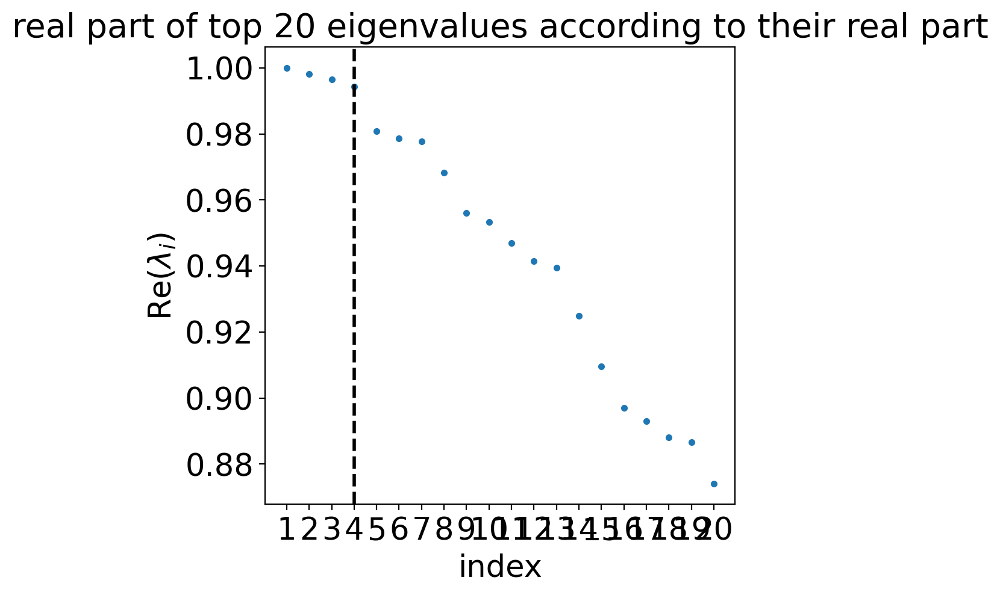

In [13]:
estimator = cr.estimators.GPCCA(rtk)
estimator.compute_schur(n_components=20)
estimator.plot_spectrum(real_only=True)
plt.show()

In [14]:
terminal_states = [
    "late_Dlx2",
    "late_Runx1",
    "parathyroid",
    "cTEC",
    "mTEC",
    "late_Grhl3",
    "late_Pitx2",
    "ubb",
    "thyroid",
    "late_Dmrt1",
    "late_respiratory",
]
cluster_key = "cluster_name"

if (DATA_DIR / "pharyngeal_endoderm" / "results" / "tsi-full_data-rtk.csv").is_file():
    tsi_df = pd.read_csv(DATA_DIR / "pharyngeal_endoderm" / "results" / "tsi-full_data-rtk.csv")
    estimator._tsi = AnnData(tsi_df, uns={"terminal_states": terminal_states, "cluster_key": cluster_key})
    tsi_score = estimator.tsi(n_macrostates=20, terminal_states=terminal_states, cluster_key=cluster_key)
else:
    tsi_score = estimator.tsi(n_macrostates=20, terminal_states=terminal_states, cluster_key=cluster_key)
    estimator._tsi.to_df().to_csv(DATA_DIR / "pharyngeal_endoderm" / "results" / "tsi-full_data-rtk.csv", index=False)

print(f"TSI score: {tsi_score:.2f}")

TSI score: 0.92


/vol/storage/miniconda3/envs/cr2-py38/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


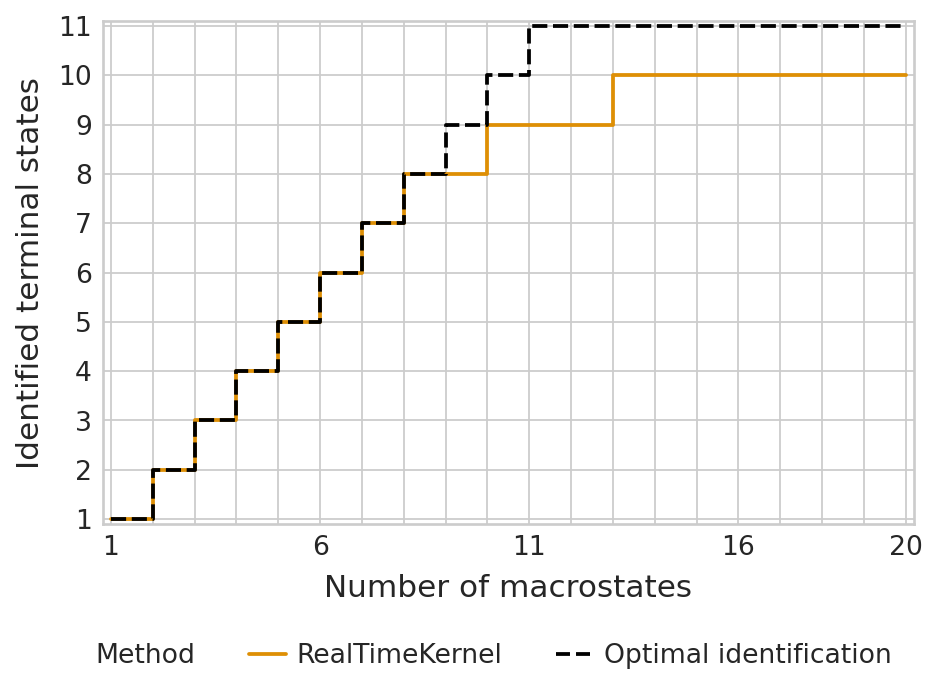

In [15]:
palette = {"RealTimeKernel": "#DE8F05", "Optimal identification": "#000000"}

if SAVE_FIGURES:
    fpath = FIG_DIR / "realtime_kernel" / "pharyngeal_endoderm" / f"tsi-full_data-rtk.{FIGURE_FORMAT}"
else:
    fpath = None

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    estimator.plot_tsi(palette=palette, save=fpath)
    plt.show()

Computing `13` macrostates
DEBUG: Setting the macrostates using macrostates memberships
DEBUG: Raising an exception if there are less than `6` cells.
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:01:59)


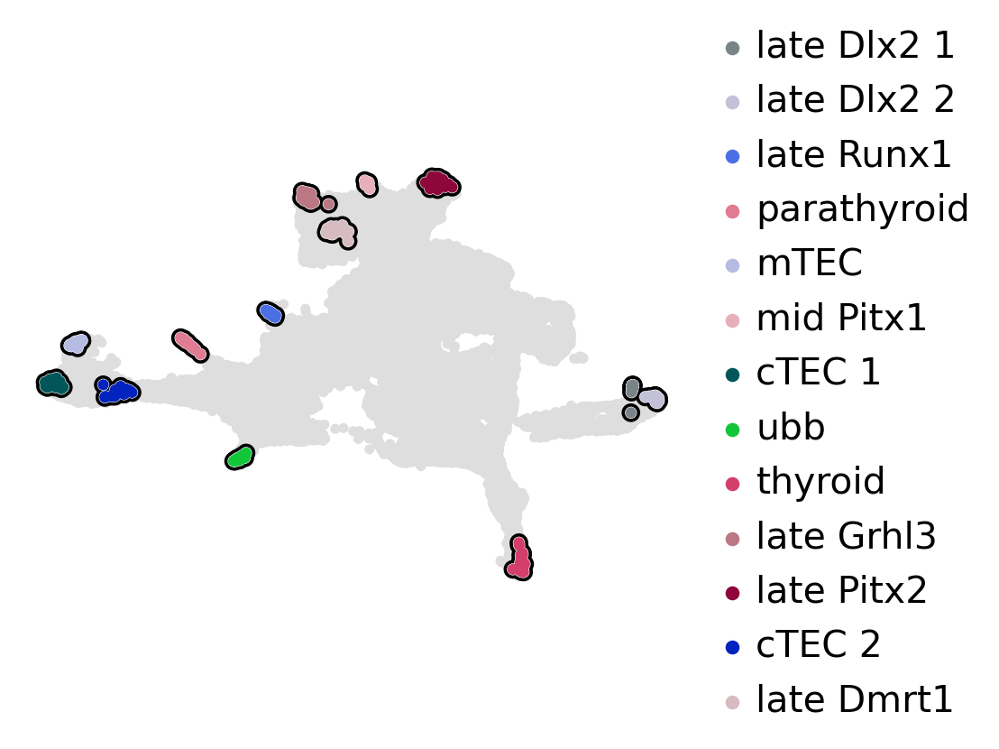

In [16]:
estimator.compute_macrostates(n_states=13, cluster_key="cluster_name")
if running_in_notebook():
    estimator.plot_macrostates(which="all", basis="umap", title="", legend_loc="right", size=100)
    if SAVE_FIGURES:
        fpath = (
            FIG_DIR
            / "realtime_kernel"
            / "pharyngeal_endoderm"
            / f"umap_colored_by_macrostates_full_data.{FIGURE_FORMAT}"
        )
        estimator.plot_macrostates(which="all", basis="umap", title="", legend_loc=False, size=100, save=fpath)

Mean purity: 0.9974358974358974


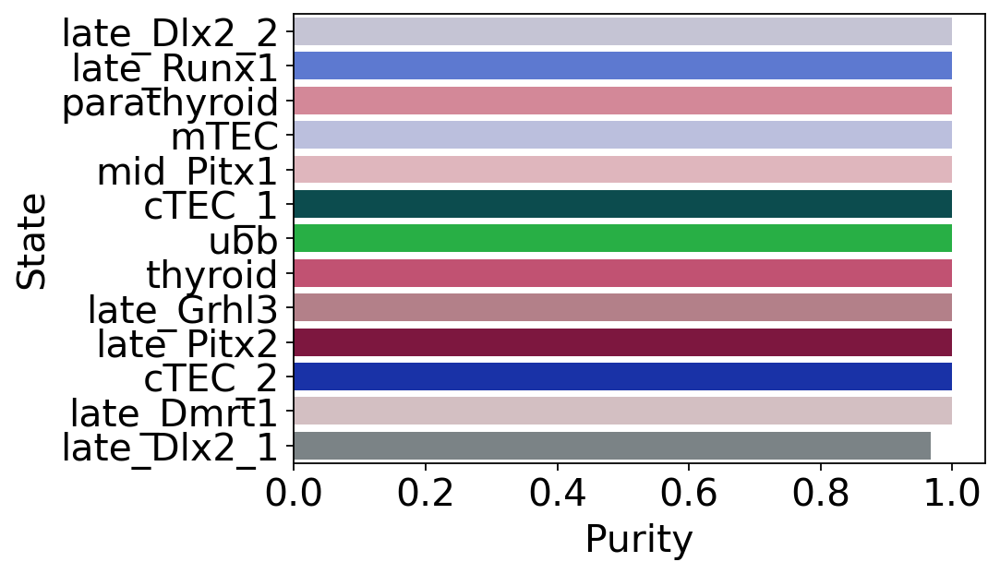

In [17]:
macrostate_purity = get_state_purity(adata, estimator, states="macrostates", obs_col="cluster_name")
print(f"Mean purity: {np.mean(list(macrostate_purity.values()))}")

if running_in_notebook():
    if SAVE_FIGURES:
        fpath = FIG_DIR / "realtime_kernel" / "pharyngeal_endoderm" / f"macrostate_purity_full_data.{FIGURE_FORMAT}"
    else:
        fpath = None

    palette = dict(zip(estimator.macrostates.cat.categories, estimator._macrostates.colors))

    plot_state_purity(macrostate_purity, palette=palette, fpath=fpath, format=FIGURE_FORMAT)
    plt.show()

DEBUG: Raising an exception if there are less than `6` cells.
Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


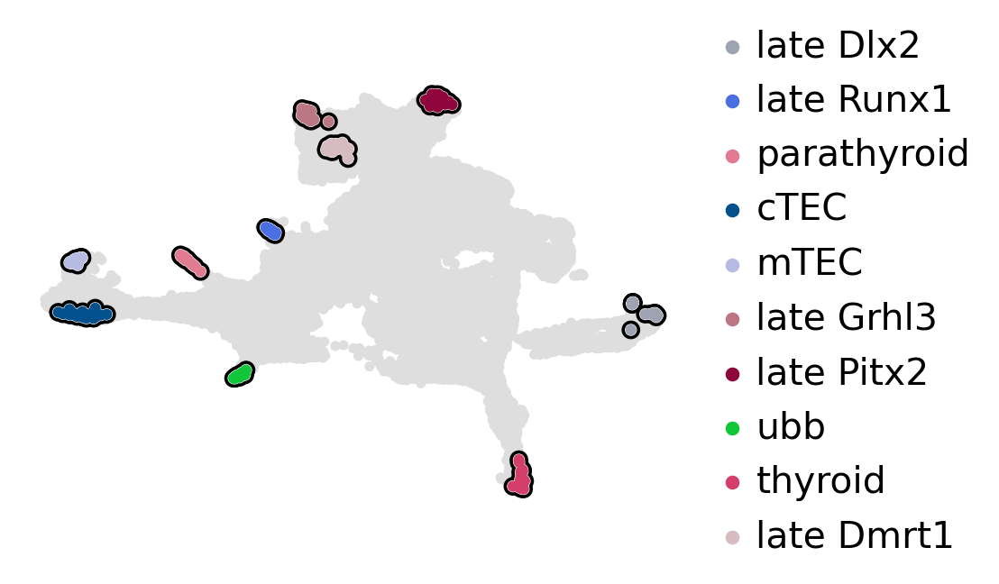

In [18]:
estimator.set_terminal_states(
    [
        "late_Dlx2_1, late_Dlx2_2",
        "late_Runx1",
        "parathyroid",
        "cTEC_1, cTEC_2",
        "mTEC",
        "late_Grhl3",
        "late_Pitx2",
        "ubb",
        "thyroid",
        "late_Dmrt1",
    ]
)

estimator.rename_terminal_states({"cTEC_1, cTEC_2": "cTEC", "late_Dlx2_1, late_Dlx2_2": "late_Dlx2"})

if running_in_notebook():
    estimator.plot_macrostates(which="terminal", basis="umap", title="", legend_loc="right", size=100)
    if SAVE_FIGURES:
        fpath = (
            FIG_DIR
            / "realtime_kernel"
            / "pharyngeal_endoderm"
            / f"umap_colored_by_terminal_states_full_data.{FIGURE_FORMAT}"
        )
        estimator.plot_macrostates(which="terminal", basis="umap", title="", legend_loc=False, size=100, save=fpath)

Mean purity: 1.0


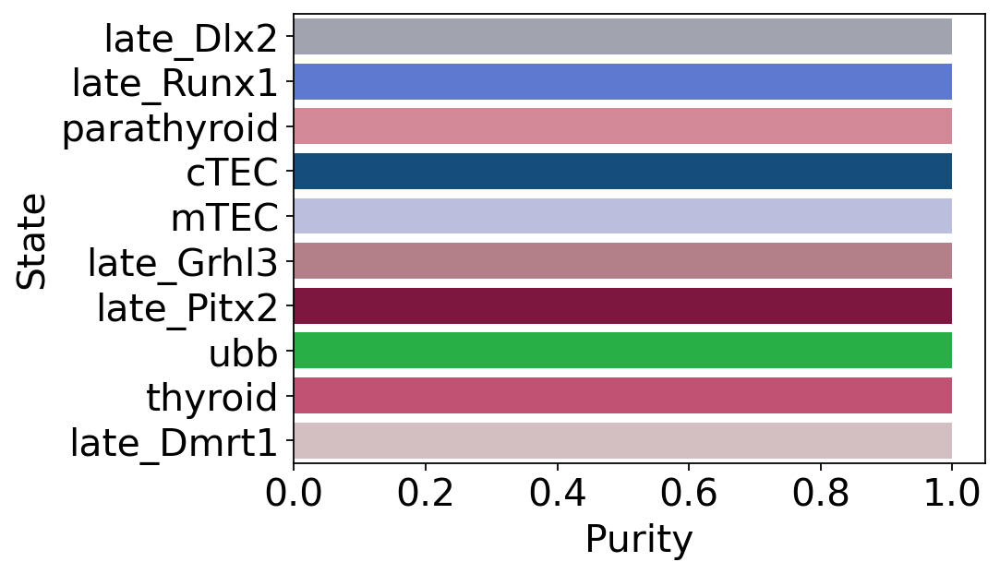

In [19]:
terminal_state_purity = get_state_purity(adata, estimator, states="terminal_states", obs_col="cluster_name")
print(f"Mean purity: {np.mean(list(terminal_state_purity.values()))}")

if running_in_notebook():
    if SAVE_FIGURES:
        fpath = (
            FIG_DIR / "realtime_kernel" / "pharyngeal_endoderm" / f"terminal_states_purity_full_data.{FIGURE_FORMAT}"
        )
    else:
        fpath = None

    palette = dict(zip(estimator.terminal_states.cat.categories, estimator._term_states.colors))

    plot_state_purity(terminal_state_purity, palette=palette, fpath=fpath, format=FIGURE_FORMAT)
    plt.show()

In [20]:
estimator.compute_fate_probabilities(solver="gmres", use_petsc=True)

Computing fate probabilities
DEBUG: Solving the linear system using `PETSc` solver `'gmres'` on `1` core(s) with no preconditioner and `tol=1e-06`


  0%|          | 0/10 [00:00<?, ?/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:03)


[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


Computing fate probabilities
DEBUG: Solving the linear system using `PETSc` solver `'gmres'` on `1` core(s) with no preconditioner and `tol=1e-06`


  0%|          | 0/10 [00:00<?, ?/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:03)


[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: 

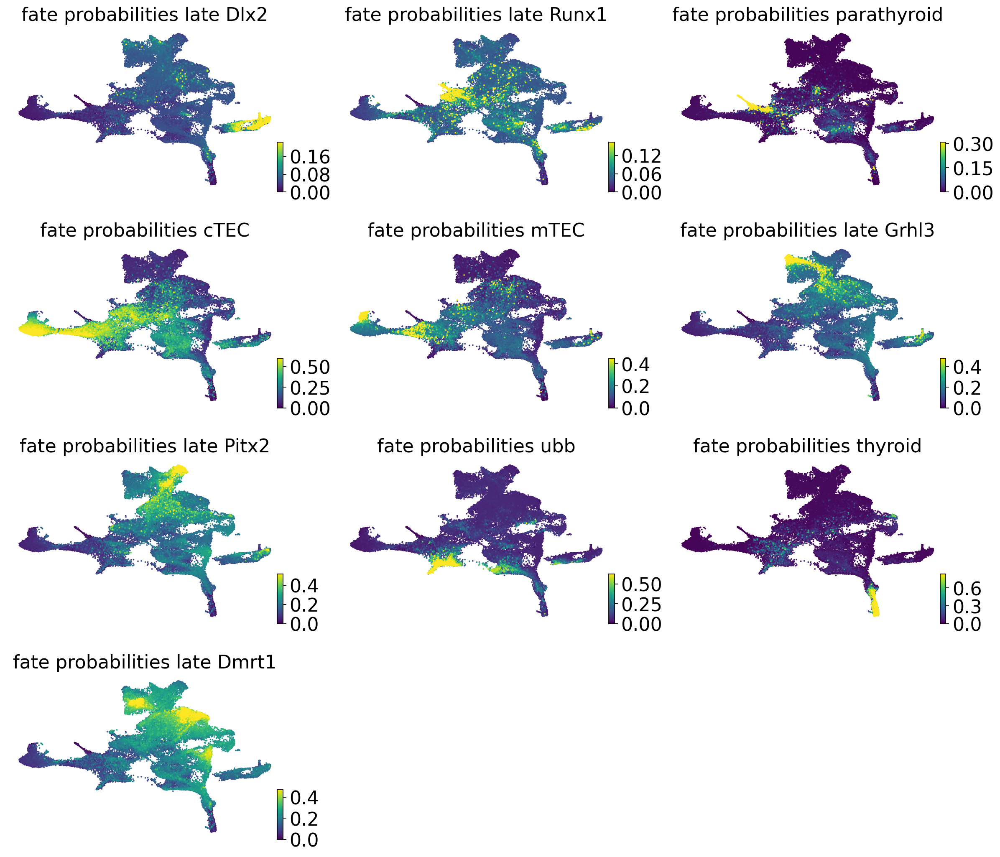

In [21]:
estimator.compute_fate_probabilities()
if running_in_notebook():
    estimator.plot_fate_probabilities(same_plot=False, basis="umap", perc=[0, 99], ncols=3)

if SAVE_FIGURES:
    for terminal_state in estimator.terminal_states.cat.categories:
        adata.obs[f"fate_prob_{terminal_state}"] = adata.obsm["lineages_fwd"][:, terminal_state].X.squeeze()
        fig, ax = plt.subplots(figsize=(6, 4))

        if running_in_notebook():
            scv.pl.scatter(
                adata,
                basis="umap",
                color=f"fate_prob_{terminal_state}",
                cmap="viridis",
                title="",
                colorbar=False,
                ax=ax,
            )

            fig.savefig(
                FIG_DIR
                / "realtime_kernel"
                / "pharyngeal_endoderm"
                / f"fate_prob_{terminal_state}_full_data.{FIGURE_FORMAT}",
                format=FIGURE_FORMAT,
                transparent=True,
                bbox_inches="tight",
            )

### Driver analysis

In [22]:
adata.obs["cluster_name_"] = adata.obs["cluster_name"].copy().astype(str).astype("category")

DEBUG: Computing correlations for lineages `['cTEC']` restricted to clusters `['nan', 'early_thymus', 'cTEC']` in layer `X` with `use_raw=False`
Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:09)


(array([11]),)

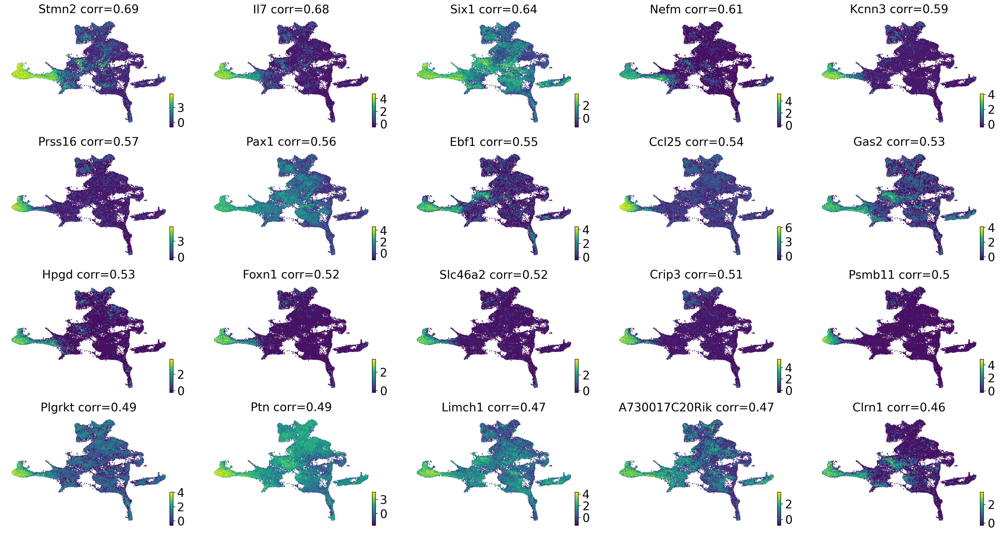

In [23]:
drivers_ctec = estimator.compute_lineage_drivers(
    return_drivers=True, cluster_key="cluster_name_", lineages=["cTEC"], clusters=["nan", "early_thymus", "cTEC"]
)

gene_names = drivers_ctec.loc[
    ~(
        drivers_ctec.index.str.startswith(("mt.", "Rpl", "Rps", "^Hb[^(p)]"))
        | drivers_ctec.index.isin(S_GENES + G2M_GENES)
    ),
    :,
].index

if running_in_notebook():
    estimator.plot_lineage_drivers(lineage="cTEC", n_genes=20, ncols=5, title_fmt="{gene} corr={corr:.2}")

    if SAVE_FIGURES:
        fig, ax = plt.subplots(figsize=(6, 4))
        scv.pl.scatter(
            adata, basis="umap", c="Foxn1", cmap="viridis", title="", legend_loc=None, colorbar=False, ax=ax, s=25
        )
        fig.savefig(
            FIG_DIR / "realtime_kernel" / "pharyngeal_endoderm" / f"umap_colored_by_foxn1_full_data.{FIGURE_FORMAT}",
            format=FIGURE_FORMAT,
            transparent=True,
            bbox_inches="tight",
        )

np.where(gene_names == "Foxn1")

DEBUG: Computing correlations for lineages `['parathyroid']` restricted to clusters `['nan']` in layer `X` with `use_raw=False`
Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:07)


(array([0]),)

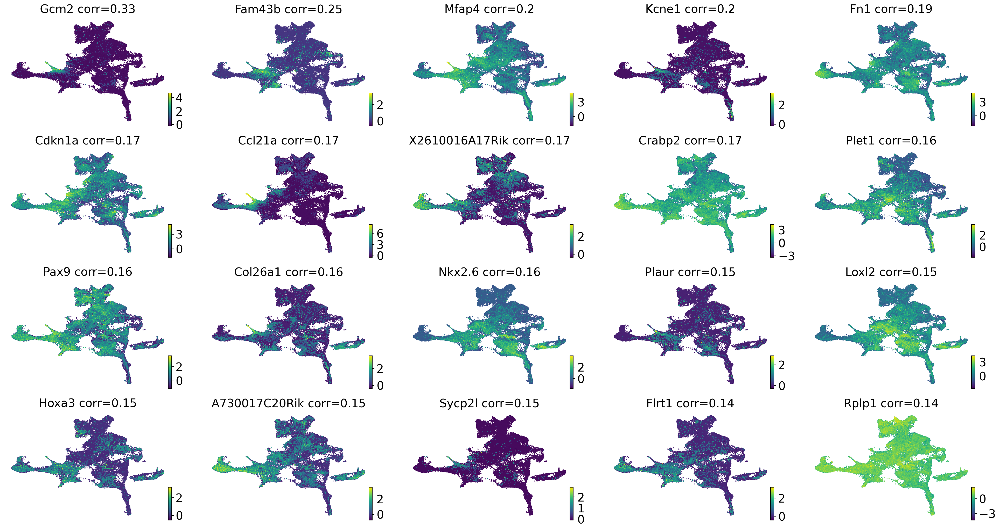

In [24]:
drivers_parathyroid = estimator.compute_lineage_drivers(
    return_drivers=True, cluster_key="cluster_name_", lineages=["parathyroid"], clusters=["nan"]
)

gene_names = drivers_parathyroid.loc[
    ~(
        drivers_parathyroid.index.str.startswith(("mt.", "Rpl", "Rps", "^Hb[^(p)]"))
        | drivers_parathyroid.index.isin(S_GENES + G2M_GENES)
    ),
    :,
].index

if running_in_notebook():
    estimator.plot_lineage_drivers(lineage="parathyroid", n_genes=20, ncols=5, title_fmt="{gene} corr={corr:.2}")

    if SAVE_FIGURES:
        fig, ax = plt.subplots(figsize=(6, 4))
        scv.pl.scatter(
            adata, basis="umap", c="Gcm2", cmap="viridis", title="", legend_loc=None, colorbar=False, ax=ax, s=25
        )
        fig.savefig(
            FIG_DIR / "realtime_kernel" / "pharyngeal_endoderm" / f"umap_colored_by_gcm2_full_data.{FIGURE_FORMAT}",
            format=FIGURE_FORMAT,
            transparent=True,
            bbox_inches="tight",
        )

np.where(gene_names == "Gcm2")

DEBUG: Computing correlations for lineages `['thyroid']` restricted to clusters `['nan']` in layer `X` with `use_raw=False`
Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:07)


(array([0]),)

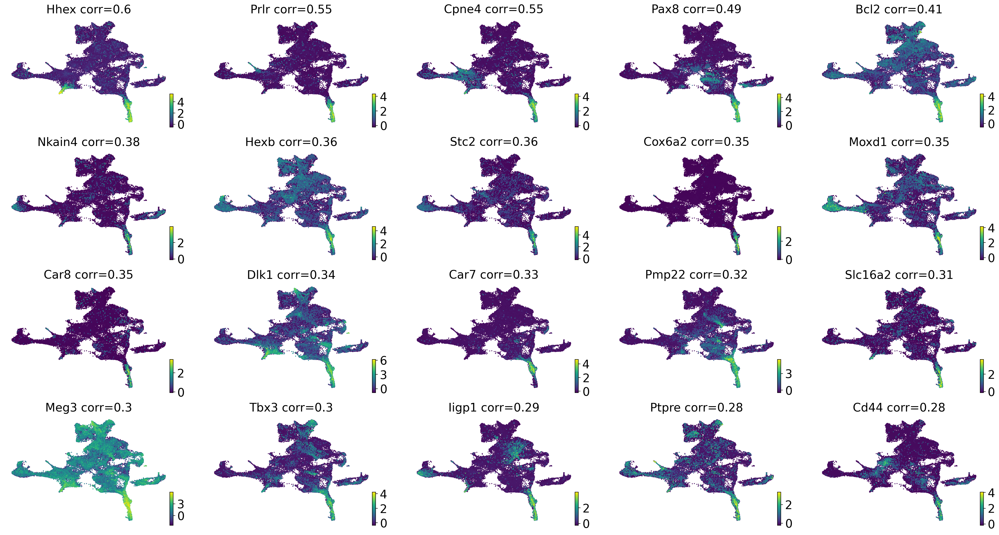

In [25]:
drivers_thyroid = estimator.compute_lineage_drivers(
    return_drivers=True, cluster_key="cluster_name_", lineages=["thyroid"], clusters=["nan"]
)

gene_names = drivers_thyroid.loc[
    ~(
        drivers_thyroid.index.str.startswith(("mt.", "Rpl", "Rps", "^Hb[^(p)]"))
        | drivers_thyroid.index.isin(S_GENES + G2M_GENES)
    ),
    :,
].index

if running_in_notebook():
    estimator.plot_lineage_drivers(lineage="thyroid", n_genes=20, ncols=5, title_fmt="{gene} corr={corr:.2}")

    if SAVE_FIGURES:
        fig, ax = plt.subplots(figsize=(6, 4))
        scv.pl.scatter(
            adata, basis="umap", c="Hhex", cmap="viridis", title="", legend_loc=None, colorbar=False, ax=ax, s=25
        )
        fig.savefig(
            FIG_DIR / "realtime_kernel" / "pharyngeal_endoderm" / f"umap_colored_by_hhex_full_data.{FIGURE_FORMAT}",
            format=FIGURE_FORMAT,
            transparent=True,
            bbox_inches="tight",
        )

np.where(gene_names == "Hhex")